In [ ]:

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure


%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)


pd.options.mode.chained_assignment = None


# read the data

df = pd.read_csv('/content/drive/MyDrive/portfolio/movies.csv')

In [ ]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


In [ ]:
df.dtypes

,0
name,object
rating,object
genre,object
year,int64
released,object
score,float64
votes,float64
director,object
writer,object
star,object


In [ ]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [ ]:
#finding out the missing data

for col in df.columns:
  pct_missing = np.mean(df[col].isnull())
  print('{} - {}%'.format(col, round(pct_missing*100)))


name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [95]:
# Handle missing/infinite values before conversion

df['runtime'] = df['runtime'].fillna(0).astype('int64')
df['score'] = df['score'].fillna(0).astype('int64')
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149,Apri


In [96]:
df['ratingn']= df['genre'].astype(str).str[:4]
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162,Dece,Acti
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181,Apri,Acti
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194,Dece,Dram
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138,Dece,Acti
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149,Apri,Acti


In [97]:
df = df.sort_values(by=['score'], inplace=False, ascending=False)

In [99]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5243,The Dark Knight,PG-13,Action,2008,"July 18, 2008 (United States)",9,2400000.0,Christopher Nolan,Jonathan Nolan,Christian Bale,United States,185000000.0,1.005974e+09,Warner Bros.,152,July,Acti
2443,The Shawshank Redemption,R,Drama,1994,"October 14, 1994 (United States)",9,2400000.0,Frank Darabont,Stephen King,Tim Robbins,United States,25000000.0,2.881729e+07,Castle Rock Entertainment,142,Octo,Dram
92,Indiana Jones and the Raiders of the Lost Ark,PG,Action,1981,"June 12, 1981 (United States)",8,905000.0,Steven Spielberg,Lawrence Kasdan,Harrison Ford,United States,18000000.0,3.899260e+08,Paramount Pictures,115,June,Acti
5266,Slumdog Millionaire,R,Drama,2008,"December 25, 2008 (United States)",8,812000.0,Danny Boyle,Simon Beaufoy,Dev Patel,United Kingdom,15000000.0,3.784105e+08,Celador Films,120,Dece,Dram
3243,The Big Lebowski,R,Comedy,1998,"March 6, 1998 (United States)",8,754000.0,Joel Coen,Ethan Coen,Jeff Bridges,United States,15000000.0,4.674872e+07,Polygram Filmed Entertainment,117,Marc,Come
1643,Goodfellas,R,Biography,1990,"September 21, 1990 (United States)",8,1100000.0,Martin Scorsese,Nicholas Pileggi,Robert De Niro,United States,25000000.0,4.696328e+07,Warner Bros.,146,Sept,Biog
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,4.699877e+07,Warner Bros.,146,June,Dram
645,Back to the Future,PG,Adventure,1985,"July 3, 1985 (United States)",8,1100000.0,Robert Zemeckis,Robert Zemeckis,Michael J. Fox,United States,19000000.0,3.819068e+08,Universal Pictures,116,July,Adve
6547,The Raid 2,R,Action,2014,"April 11, 2014 (United States)",8,117000.0,Gareth Evans,Gareth Evans,Iko Uwais,Indonesia,4500000.0,6.566916e+06,Sony Pictures Classics,150,Apri,Acti
7462,1917,R,Drama,2019,"January 10, 2020 (United States)",8,473000.0,Sam Mendes,Sam Mendes,Dean-Charles Chapman,United States,95000000.0,3.846236e+08,Dreamworks Pictures,119,Janu,Dram


In [ ]:
pd.set_option('display.max_rows', None)

In [100]:
# Dropping the duplicates

df['director'].sort_values(ascending=False)


,director
3959,Éva Gárdos
2974,Éric Rohmer
1198,Éric Rohmer
964,Éric Rohmer
1190,Éric Rohmer
601,Éric Rohmer
1810,Éric Rohmer
2220,Éric Rohmer
3829,Élie Chouraqui
1137,Élie Chouraqui


In [ ]:
df.drop_duplicates

In [103]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5243,The Dark Knight,PG-13,Action,2008,"July 18, 2008 (United States)",9,2400000.0,Christopher Nolan,Jonathan Nolan,Christian Bale,United States,185000000.0,1.005974e+09,Warner Bros.,152,July,Acti
2443,The Shawshank Redemption,R,Drama,1994,"October 14, 1994 (United States)",9,2400000.0,Frank Darabont,Stephen King,Tim Robbins,United States,25000000.0,2.881729e+07,Castle Rock Entertainment,142,Octo,Dram
92,Indiana Jones and the Raiders of the Lost Ark,PG,Action,1981,"June 12, 1981 (United States)",8,905000.0,Steven Spielberg,Lawrence Kasdan,Harrison Ford,United States,18000000.0,3.899260e+08,Paramount Pictures,115,June,Acti
5266,Slumdog Millionaire,R,Drama,2008,"December 25, 2008 (United States)",8,812000.0,Danny Boyle,Simon Beaufoy,Dev Patel,United Kingdom,15000000.0,3.784105e+08,Celador Films,120,Dece,Dram
3243,The Big Lebowski,R,Comedy,1998,"March 6, 1998 (United States)",8,754000.0,Joel Coen,Ethan Coen,Jeff Bridges,United States,15000000.0,4.674872e+07,Polygram Filmed Entertainment,117,Marc,Come


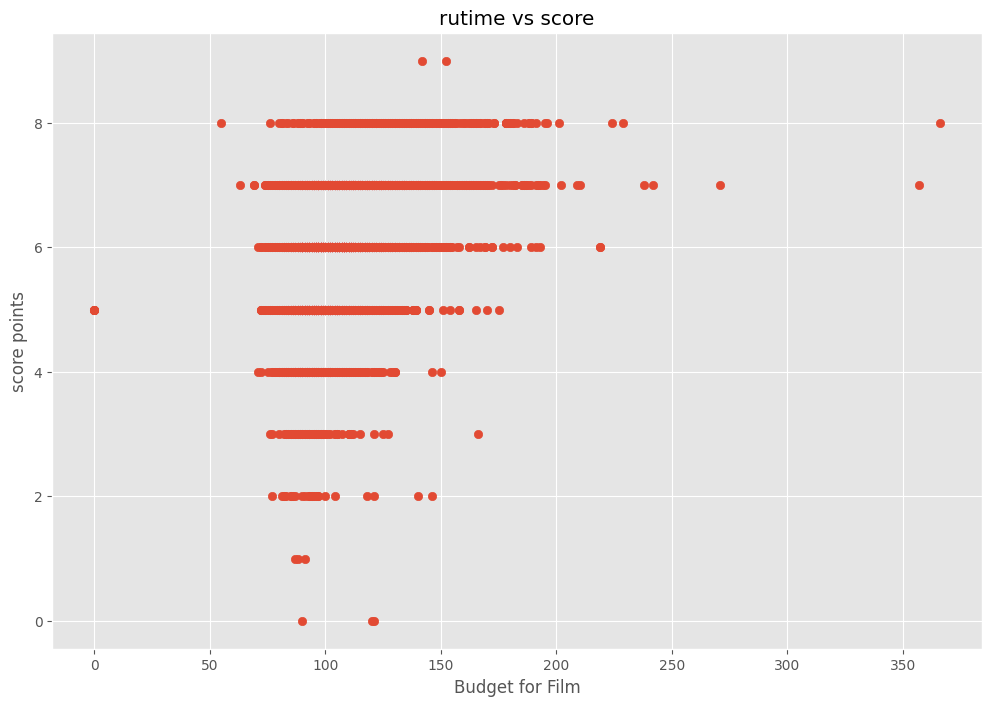

In [104]:
#plots with budget vs gross

plt.scatter(x=df['runtime'], y=df['score'])
plt.title('rutime vs score')
plt.xlabel('Budget for Film')
plt.ylabel('score points')
plt.show()

<Axes: xlabel='runtime', ylabel='score'>

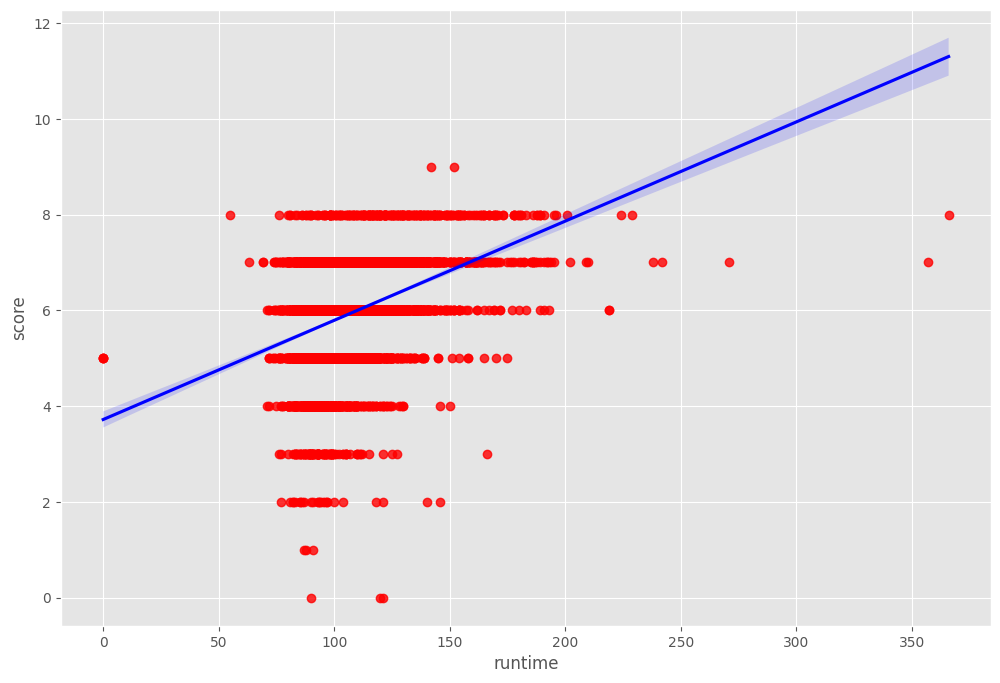

In [105]:
#plot budget  vs gross using seaborn

sns.regplot(x='runtime', y='score', data=df, scatter_kws={'color':'red'}, line_kws={'color':'blue'})

In [106]:
# check for the correlation
#df.corr(method='pearson') #pearson, kendall, spearman

df.corr(numeric_only=True)

,year,score,votes,budget,gross,runtime
year,1.000000,0.091429,0.222945,0.329321,0.257486,0.116358
score,0.091429,1.000000,0.393355,0.072243,0.177215,0.379436
votes,0.222945,0.393355,1.000000,0.442429,0.630757,0.307074
budget,0.329321,0.072243,0.442429,1.000000,0.740395,0.319190
gross,0.257486,0.177215,0.630757,0.740395,1.000000,0.244854
runtime,0.116358,0.379436,0.307074,0.319190,0.244854,1.000000


Text(120.72222222222221, 0.5, 'Movie Features')

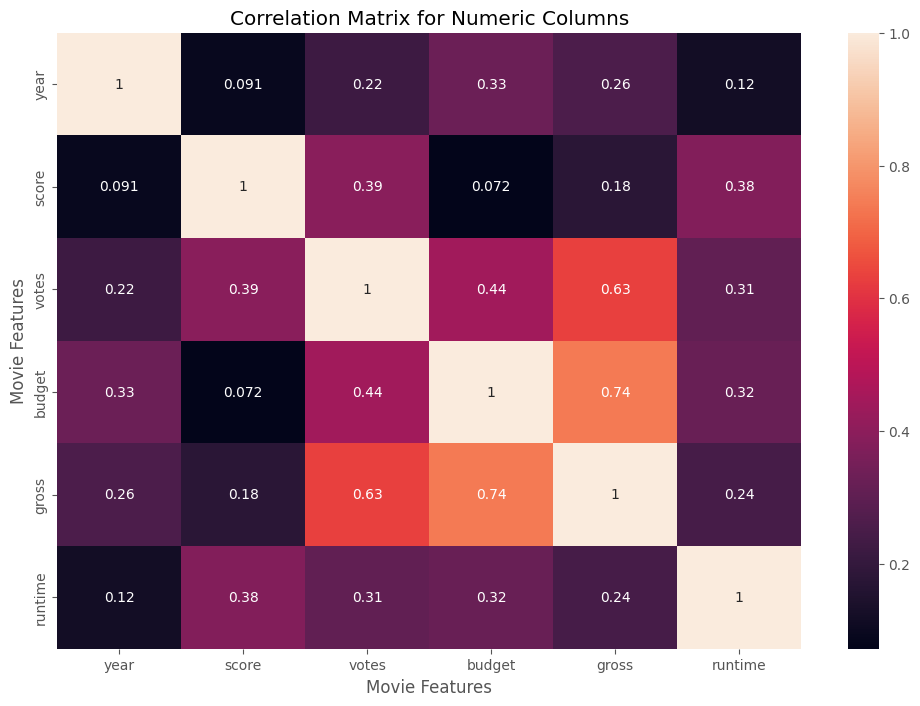

In [107]:
#high correlation between rutime and score

correlation_matrix = df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Columns')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

In [108]:
#Looks at Company
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5243,The Dark Knight,PG-13,Action,2008,"July 18, 2008 (United States)",9,2400000.0,Christopher Nolan,Jonathan Nolan,Christian Bale,United States,185000000.0,1.005974e+09,Warner Bros.,152,July,Acti
2443,The Shawshank Redemption,R,Drama,1994,"October 14, 1994 (United States)",9,2400000.0,Frank Darabont,Stephen King,Tim Robbins,United States,25000000.0,2.881729e+07,Castle Rock Entertainment,142,Octo,Dram
92,Indiana Jones and the Raiders of the Lost Ark,PG,Action,1981,"June 12, 1981 (United States)",8,905000.0,Steven Spielberg,Lawrence Kasdan,Harrison Ford,United States,18000000.0,3.899260e+08,Paramount Pictures,115,June,Acti
5266,Slumdog Millionaire,R,Drama,2008,"December 25, 2008 (United States)",8,812000.0,Danny Boyle,Simon Beaufoy,Dev Patel,United Kingdom,15000000.0,3.784105e+08,Celador Films,120,Dece,Dram
3243,The Big Lebowski,R,Comedy,1998,"March 6, 1998 (United States)",8,754000.0,Joel Coen,Ethan Coen,Jeff Bridges,United States,15000000.0,4.674872e+07,Polygram Filmed Entertainment,117,Marc,Come


In [109]:
df_numerized = df

for col_name in df_numerized.columns:
  if(df_numerized[col_name].dtype == 'object'):
    df_numerized[col_name] = df_numerized[col_name].astype('category')
    df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5243,5725,5,0,2008,1476,9,2400000.0,483,2265,442,55,185000000.0,1.005974e+09,2319,152,13,0
2443,6585,6,6,1994,2858,9,2400000.0,872,4014,2617,55,25000000.0,2.881729e+07,599,142,18,6
92,2768,4,0,1981,1696,8,905000.0,2660,2550,959,55,18000000.0,3.899260e+08,1812,115,14,0
5266,4978,6,6,2008,798,8,812000.0,585,3954,645,54,15000000.0,3.784105e+08,610,120,10,6
3243,5555,6,4,1998,2188,8,754000.0,1349,1323,1161,55,15000000.0,4.674872e+07,1872,117,15,4


In [110]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5243,5725,5,0,2008,1476,9,2400000.0,483,2265,442,55,185000000.0,1.005974e+09,2319,152,13,0
2443,6585,6,6,1994,2858,9,2400000.0,872,4014,2617,55,25000000.0,2.881729e+07,599,142,18,6
92,2768,4,0,1981,1696,8,905000.0,2660,2550,959,55,18000000.0,3.899260e+08,1812,115,14,0
5266,4978,6,6,2008,798,8,812000.0,585,3954,645,54,15000000.0,3.784105e+08,610,120,10,6
3243,5555,6,4,1998,2188,8,754000.0,1349,1323,1161,55,15000000.0,4.674872e+07,1872,117,15,4


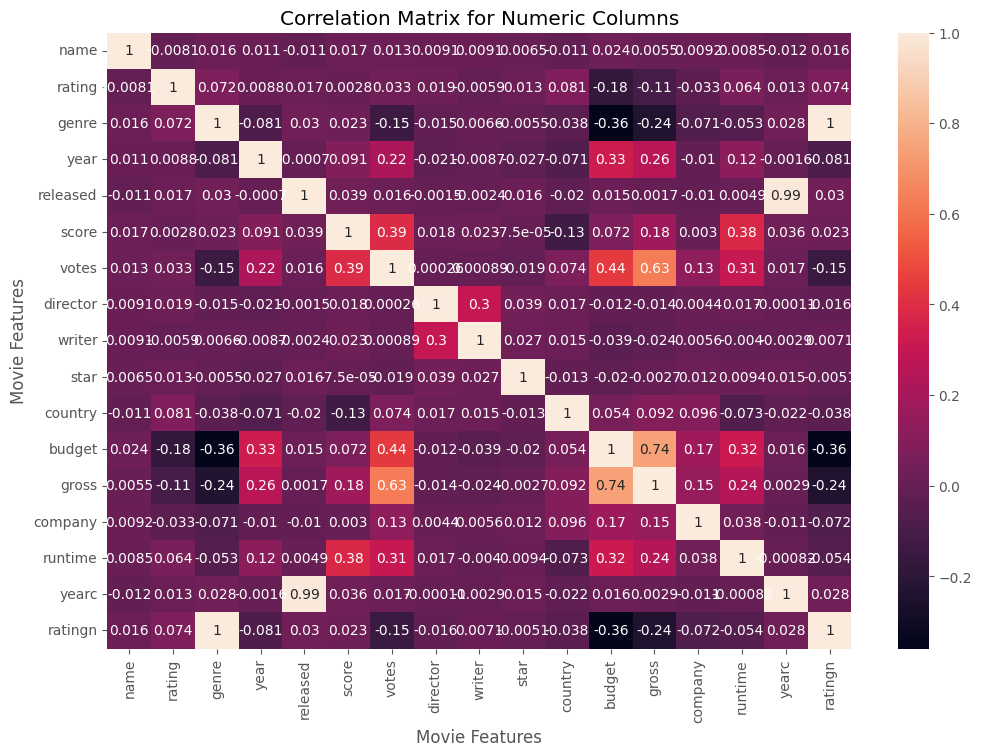

In [111]:
correlation_matrix = df_numerized.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Columns')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [113]:
df_numerized.corr()
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearc,ratingn
5243,5725,5,0,2008,1476,9,2400000.0,483,2265,442,55,185000000.0,1.005974e+09,2319,152,13,0
2443,6585,6,6,1994,2858,9,2400000.0,872,4014,2617,55,25000000.0,2.881729e+07,599,142,18,6
92,2768,4,0,1981,1696,8,905000.0,2660,2550,959,55,18000000.0,3.899260e+08,1812,115,14,0
5266,4978,6,6,2008,798,8,812000.0,585,3954,645,54,15000000.0,3.784105e+08,610,120,10,6
3243,5555,6,4,1998,2188,8,754000.0,1349,1323,1161,55,15000000.0,4.674872e+07,1872,117,15,4


In [114]:
correlation_matrix = df_numerized.corr()
corr_pairs = correlation_matrix.unstack()
corr_pairs

name      name        1.000000
          rating     -0.008069
          genre       0.016355
          year        0.011453
          released   -0.011311
          score       0.017191
          votes       0.013088
          director    0.009079
          writer      0.009081
          star        0.006472
          country    -0.010737
          budget      0.023970
          gross       0.005533
          company     0.009211
          runtime     0.008483
          yearc      -0.011725
          ratingn     0.016474
rating    name       -0.008069
          rating      1.000000
          genre       0.072423
          year        0.008779
          released    0.016613
          score       0.002753
          votes       0.033225
          director    0.019483
          writer     -0.005921
          star        0.013405
          country     0.081244
          budget     -0.176002
          gross      -0.107339
          company    -0.032943
          runtime     0.064133
          yearc       0.013475
          ratingn     0.073902
genre     name        0.016355
          rating      0.072423
          genre       1.000000
          year       -0.081261
          released    0.029822
          score       0.023134
          votes      -0.145307
          director   -0.015258
          writer      0.006567
          star       -0.005477
          country    -0.037615
          budget     -0.356564
          gross      -0.235650
          company    -0.071067
          runtime    -0.052914
          yearc       0.028397
          ratingn     0.999533
year      name        0.011453
          rating      0.008779
          genre      -0.081261
          year        1.000000
          released   -0.000695
          score       0.091429
          votes       0.222945
          director   -0.020795
          writer     -0.008656
          star       -0.027242
          country    -0.070938
          budget      0.329321
          gross       0.257486
          company    -0.010431
          runtime     0.116358
          yearc      -0.001562
          ratingn    -0.081256
released  name       -0.011311
          rating      0.016613
          genre       0.029822
          year       -0.000695
          released    1.000000
          score       0.038676
          votes       0.016097
          director   -0.001478
          writer     -0.002404
          star        0.015777
          country    -0.020427
          budget      0.014683
          gross       0.001659
          company    -0.010474
          runtime     0.004852
          yearc       0.993694
          ratingn     0.029773
score     name        0.017191
          rating      0.002753
          genre       0.023134
          year        0.091429
          released    0.038676
          score       1.000000
          votes       0.393355
          director    0.017562
          writer      0.022961
          star       -0.000075
          country    -0.125743
          budget      0.072243
          gross       0.177215
          company     0.002977
          runtime     0.379436
          yearc       0.036277
          ratingn     0.023414
votes     name        0.013088
          rating      0.033225
          genre      -0.145307
          year        0.222945
          released    0.016097
          score       0.393355
          votes       1.000000
          director    0.000260
          writer      0.000892
          star       -0.019282
          country     0.073625
          budget      0.442429
          gross       0.630757
          company     0.133204
          runtime     0.307074
          yearc       0.017337
          ratingn    -0.147187
director  name        0.009079
          rating      0.019483
          genre      -0.015258
          year       -0.020795
          released   -0.001478
          score       0.017562
          votes       0.000260
          director    1.000000
          writer      0.299067
          star        0.039234
 

In [115]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

,,0
budget,ratingn,-0.359339
ratingn,budget,-0.359339
budget,genre,-0.356564
genre,budget,-0.356564
ratingn,gross,-0.237672
gross,ratingn,-0.237672
genre,gross,-0.235650
gross,genre,-0.235650
budget,rating,-0.176002
rating,budget,-0.176002


In [116]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

,,0
gross,votes,0.630757
votes,gross,0.630757
gross,budget,0.740395
budget,gross,0.740395
yearc,released,0.993694
released,yearc,0.993694
genre,ratingn,0.999533
ratingn,genre,0.999533
name,name,1.000000
writer,writer,1.000000
